Import libraries

In [ ]:
import torch
import numpy as np
import PIL
from torch.utils.data import Dataset
from torchvision import datasets
from torchvision.transforms import v2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os

Conect to google drive to have access to dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


The path of the dataset images and labels is specified.

In [ ]:
root = "/content/drive/MyDrive/UAV_Human_Detection_In_Disaster"
train_images_path = "/content/drive/MyDrive/UAV_Human_Detection_In_Disaster/train/images"
train_labels_path = "/content/drive/MyDrive/UAV_Human_Detection_In_Disaster/train/labels"
val_images_path = "/content/drive/MyDrive/UAV_Human_Detection_In_Disaster/val/images"
test_images_path = "/content/drive/MyDrive/UAV_Human_Detection_In_Disaster/test/images"
test_labels_path = "/content/drive/MyDrive/UAV_Human_Detection_In_Disaster/test/labels"

To understand the dataset, ten of the images from the training set are displayed with bounding boxes. As the labels are in YOLO format, the numbers are extracted from the text file and are plotted using matplotlib.patches. The numbers in the text file are normalized, so they are multiplied with the height and width of the image. Also, in the YOLO format, the bounding box is given with four variables: X and Y of the center of the box, and the width and height of the box. To use patches.Rectangle, $x_{min}$ and $y_{min}$ should be passed with the width and height of the box. After applying these methods, the images with bounding boxes are displayed.

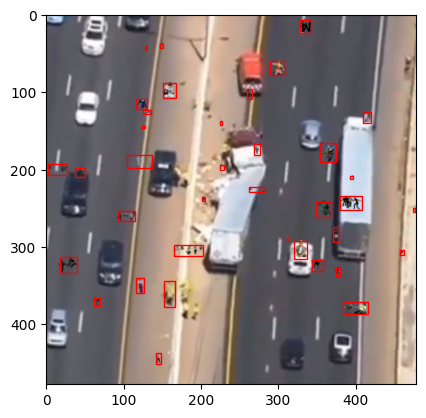

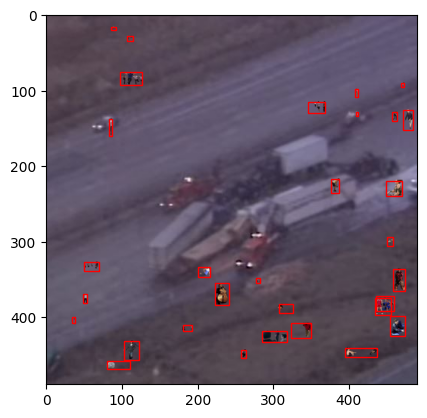

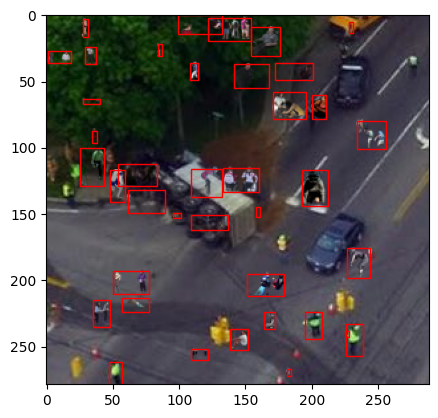

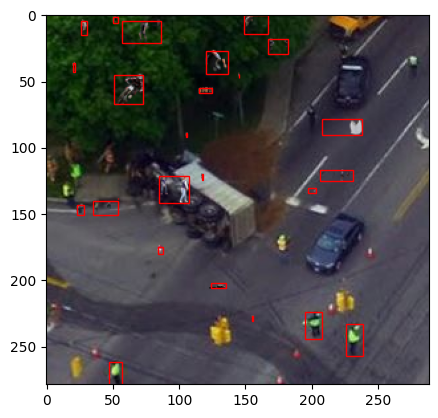

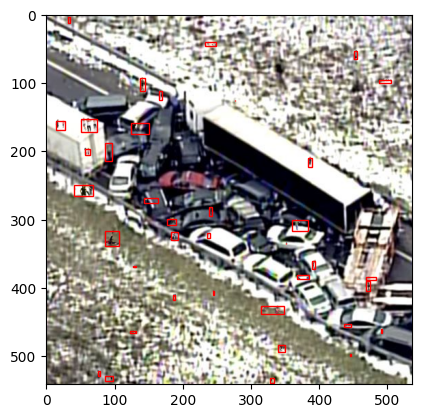

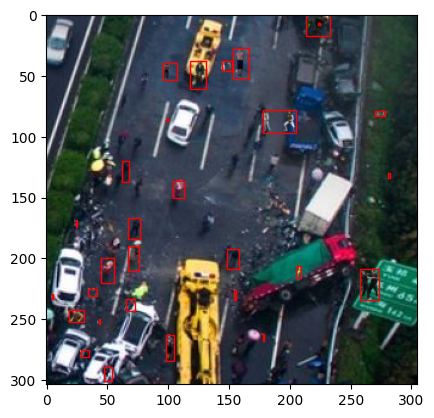

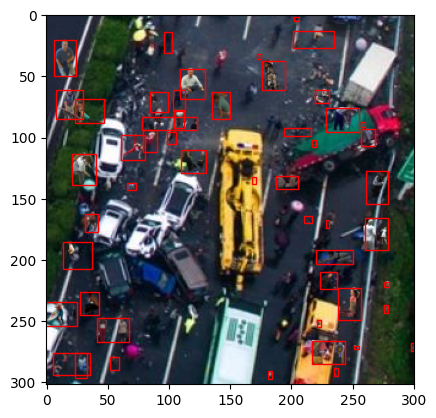

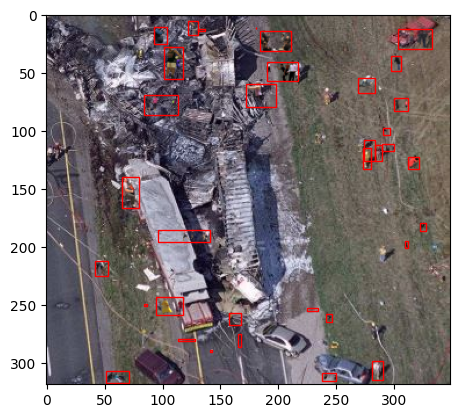

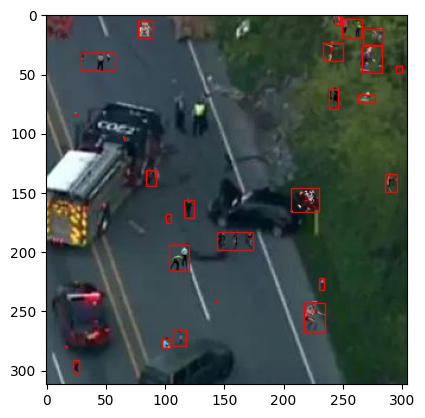

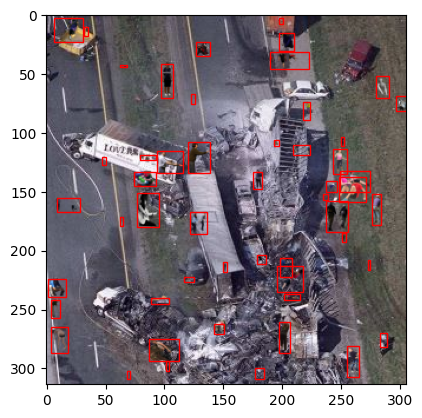

In [ ]:
num_images = 10
for img in os.listdir(train_images_path):
  if num_images == 0:
    break
  num_images -= 1
  image = PIL.Image.open(os.path.join(train_images_path, img))
  width, height = image.size
  annotation_boxs = os.path.join(train_labels_path , img.split('.')[0] + '.txt')
  fig, ax = plt.subplots()
  ax.imshow(image)
  for annotation_box in open(annotation_boxs):
    annotation_box = annotation_box.split(' ')
    x_center, y_center, box_width ,box_height = float(annotation_box[1]), float(annotation_box[2]), float(annotation_box[3]), float(annotation_box[4].split('\n')[0])
    rect = patches.Rectangle((int(x_center * width) - int((box_width * width)/2), int(y_center * height) - int((box_height * height)/2)), width = int(box_width * width), height = int(box_height * height), linewidth=1, edgecolor='r', facecolor='none')
    ax.add_patch(rect)
  plt.show()

To use the YOLOv11 model from Ultralytics, the dataset should be in the YAML file format.

In [ ]:
import yaml

The dataset, with its paths and classes, is passed in a dictionary format into YAML to create the usable dataset for the YOLOv11 model.

In [ ]:
data = dict(
    path = root,
    train = train_images_path,
    val = val_images_path,
    test = test_images_path,
    names = dict(
        [(0 , "person"),
         (1 , "bicycle"),
         (2, "car")]
    )
)

In [ ]:
with open('data.yml', 'w') as outfile:
    yaml.dump(data, outfile, default_flow_style=False)

The Ultralytics library is installed to be able to deploy the YOLOv11 model.

In [ ]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 27.0 MB/s eta 0:00:00


The YOLO model is used for this dataset. There are a couple of reasons for this decision.

1. Single-Stage and Speed: YOLO is a single-stage object detector (like SSD), meaning it processes the image in one pass. This architecture is inherently efficient, giving it a fast inference speed that is critical for real-time monitoring.

2. Best Speed-Accuracy Trade-off: While Faster R-CNN (a two-stage model) offers the highest accuracy, its slow inference speed makes it unsuitable for real-time UAV applications. Although SSD is also a fast, single-stage model, modern YOLO variants typically achieve faster inference speeds while maintaining superior or comparable accuracy.

3. Versatility : YOLO's architecture provides a strong combination of speed and high accuracy across varied scenarios, which is necessary for detecting humans from a distance and under diverse, challenging disaster conditions.

From the points above, it could be seen that YOLO provides the optimal balance of speed and accuracy required for a real-time like drone-based human detection.

No anchor box tuning is performed as the YOLO11 model uses an anchor-free model and doesn't use anchor boxes to begin the prediction process. Also, the YOLO model performs augmentation on the dataset automatically.

The model is trained for ten epochs and with an image size of 320.

In [ ]:
from ultralytics import YOLO

model = YOLO("yolo11n.pt")

results = model.train(data="/content/data.yml", epochs=10, imgsz=320)

Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data.yml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=320, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretr

The trained model is evaluated on the test set.

In [ ]:
test_results = model.val(data="/content/data.yml", split='test')

Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,737 parameters, 13,065 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.6±0.4 ms, read: 58.3±86.4 MB/s, size: 406.5 KB)
val: Scanning /content/drive/MyDrive/UAV_Human_Detection_In_Disaster/test/labels.cache... 2043 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 2043/2043 2.2Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 128/128 2.5it/s 50.3s
                   all       2043      72523      0.674      0.455      0.486      0.237
                person       2043      72523      0.674      0.455      0.486      0.237
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms loss, 2.7ms postprocess per image
Results saved to /content/runs/detect/val3


In [ ]:
print(f"mAP@0.50 (Loose Localization): {test_results.box.map50:.4f}")
print(f"mAP@0.50:0.95 (Strict Localization): {test_results.box.map:.4f}")

mAP@0.50 (Loose Localization): 0.4857
mAP@0.50:0.95 (Strict Localization): 0.2368


The model's prediction for one of the test images is displayed.

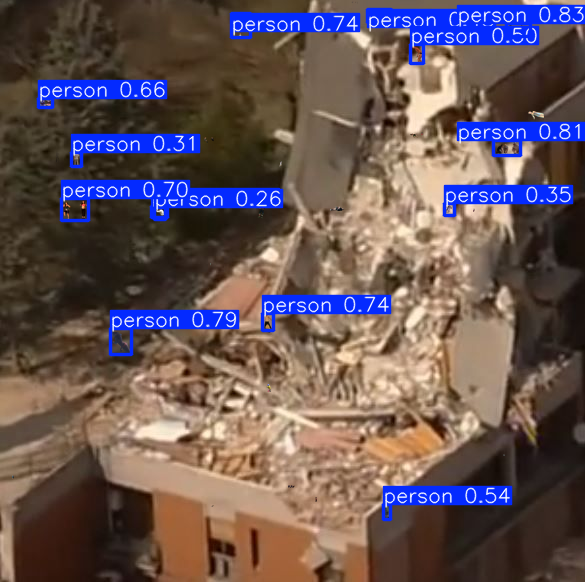

In [ ]:
from PIL import Image

test_image = "/content/drive/MyDrive/UAV_Human_Detection_In_Disaster/test/images/collapsed_building_image0019_0.png"
resultss = model(test_image)

for i, r in enumerate(resultss):

    im_bgr = r.plot()
    im_rgb = Image.fromarray(im_bgr[..., ::-1])

    r.show()

As seen from the results above, the model isn't trained well. It doesn't have a good mAP score for either the training or test set. Two reasons might have caused this issue:

1. The image size of 320 is too small.
2. Naming class labels that weren't used in the dataset.

To make the results better, a new YAML file is defined, but this time only class person is defined. Also, the training will be done with a 640 image size to see if the model can improve.

In [ ]:
new_data = dict(
    path = root,
    train = train_images_path,
    val = val_images_path,
    test = test_images_path,
    names = dict(
        [(0 , "person")]
    )
)

In [ ]:
with open('new_data.yml', 'w') as outfile:
    yaml.dump(new_data, outfile, default_flow_style=False)

The training of the model is continued but with a different dataset and a different image size.

In [ ]:
model = YOLO("/content/runs/detect/train2/weights/last.pt")
results = model.train(data="/content/new_data.yml", epochs=10, imgsz=640)

Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/new_data.yml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/runs/detect/train2/weights/last.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train5, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspect

The trained model is evaluated on the test set.

In [ ]:
test_results = model.val(data="/content/new_data.yml", split='test')

Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.2 ms, read: 44.1±32.9 MB/s, size: 406.5 KB)
val: Scanning /content/drive/MyDrive/UAV_Human_Detection_In_Disaster/test/labels.cache... 2043 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 2043/2043 2.5Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 128/128 1.6it/s 1:21
                   all       2043      72523      0.801       0.67       0.73      0.448
                person       2043      72523      0.801       0.67       0.73      0.448
Speed: 1.6ms preprocess, 4.8ms inference, 0.0ms loss, 2.7ms postprocess per image
Results saved to /content/runs/detect/val4


In [ ]:
print(f"mAP@0.50 (Loose Localization): {test_results.box.map50:.4f}")
print(f"mAP@0.50:0.95 (Strict Localization): {test_results.box.map:.4f}")

mAP@0.50 (Loose Localization): 0.7301
mAP@0.50:0.95 (Strict Localization): 0.4484


The model's prediction for one of the test images is displayed.

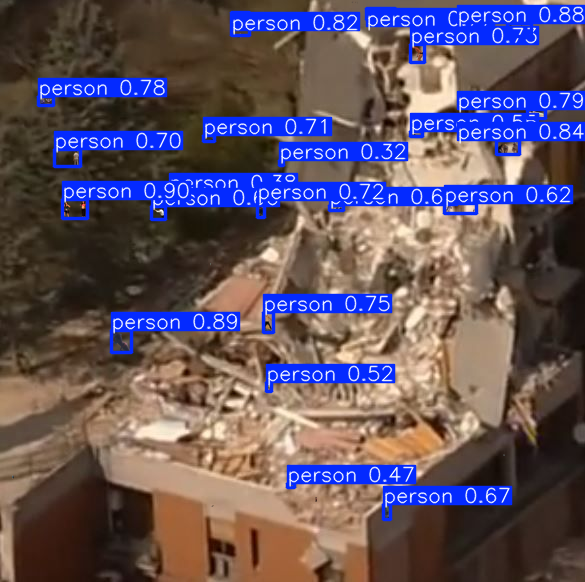

In [ ]:
test_image = "/content/drive/MyDrive/UAV_Human_Detection_In_Disaster/test/images/collapsed_building_image0019_0.png"
resultss = model(test_image)

for i, r in enumerate(resultss):

    im_bgr = r.plot()
    im_rgb = Image.fromarray(im_bgr[..., ::-1])

    r.show()

As seen in the results above, the model has improved significantly and has a decent mAP50 of $0.7301$, whereas it had an mAP50 of $0.4857$ previously. So the two changes made for the training have worked, and the model has a decent output result on the test image.

As the YOLOv11 model has augmentation automatically implemented in itself, the model trained above was using augmentation. To train the model without augmentation, the code below should be run as it's described in the [documents](https://docs.ultralytics.com/guides/yolo-data-augmentation/#example-configurations) of the YOLOv11 model on the Ultralytics site.

To be able to make a comparison with the other model, this no-augmentation model will be trained with the dataset used in the previous model and an image size of 640, which is the same as the previous model.

In [ ]:
model_no_augmentation = YOLO("yolo11n.pt")

model_no_augmentation.train(
    data="/content/new_data.yml",
    epochs=10,
    hsv_h=0.0,
    hsv_s=0.0,
    hsv_v=0.0,
    translate=0.0,
    scale=0.0,
    fliplr=0.0,
    mosaic=0.0,
    erasing=0.0,
    auto_augment=None,
    imgsz = 640
)

Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=None, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/new_data.yml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.0, exist_ok=False, fliplr=0.0, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.0, hsv_s=0.0, hsv_v=0.0, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=0.0, multi_scale=False, name=train6, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x794300f93a70>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

The trained no augmentation model is evaluated on the test set.

In [ ]:
test_results_no_augmentation = model_no_augmentation.val(data="/content/new_data.yml", split='test')

Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.5±0.1 ms, read: 41.0±41.0 MB/s, size: 406.5 KB)
val: Scanning /content/drive/MyDrive/UAV_Human_Detection_In_Disaster/test/labels.cache... 2043 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 2043/2043 2.5Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 128/128 1.6it/s 1:20
                   all       2043      72523      0.795      0.651      0.703      0.426
                person       2043      72523      0.795      0.651      0.703      0.426
Speed: 1.6ms preprocess, 4.4ms inference, 0.0ms loss, 2.7ms postprocess per image
Results saved to /content/runs/detect/val5


In [ ]:
print(f"mAP@0.50 (Loose Localization): {test_results_no_augmentation.box.map50:.4f}")
print(f"mAP@0.50:0.95 (Strict Localization): {test_results_no_augmentation.box.map:.4f}")

mAP@0.50 (Loose Localization): 0.7032
mAP@0.50:0.95 (Strict Localization): 0.4262


The model's prediction for one of the test images is displayed.

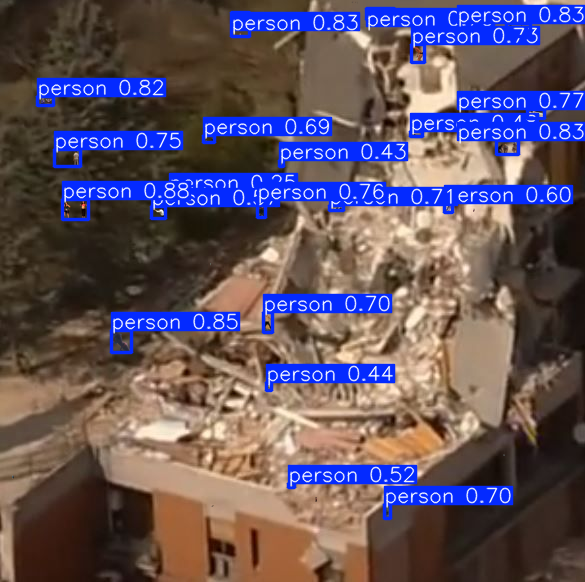

In [ ]:
test_image = "/content/drive/MyDrive/UAV_Human_Detection_In_Disaster/test/images/collapsed_building_image0019_0.png"
resultss_no_augmentation = model_no_augmentation(test_image)

for i, r in enumerate(resultss_no_augmentation):

    im_bgr = r.plot()
    im_rgb = Image.fromarray(im_bgr[..., ::-1])

    r.show()

As it can be seen above, the model has performed well even without augmentation. Its mAP50 score on the test set is $0.7032$, which is the same as the mAP50 score of the previous model. But the previous model was trained first on a dataset with three classes and an image size of $320$. Also, the previous model had a total of 20 epochs of training compared to just 10 epochs for the current model. Because of these differences, it isn't possible to draw a conclusion from the result. Because of that, two new models will be trained from scratch using the same dataset and image size, with the only difference being one has augmentations on and another one has it off.

The models will be trained for 10 epochs with an image size of $960$. This image size was chosen because of the limit of GPU allowed to use on Google Colab. First, the model with augmentation is trained, and after that, the model without augmentation is trained.

In [ ]:
from ultralytics import YOLO

model = YOLO("yolo11n.pt")

results = model.train(data="/content/new_data.yml", epochs=10, imgsz=960)

Ultralytics 8.3.225 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/new_data.yml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=960, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, p

The trained model is evaluated on the test set.

In [ ]:
test_results = model.val(data="/content/new_data.yml", split='test')

Ultralytics 8.3.225 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 1.6±2.6 ms, read: 0.4±0.5 MB/s, size: 406.5 KB)
val: Scanning /content/drive/MyDrive/UAV_Human_Detection_In_Disaster/test/labels.cache... 2043 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 2043/2043 2.4Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 128/128 0.7it/s 2:57
                   all       2043      72523      0.838      0.738      0.797      0.536
Speed: 2.7ms preprocess, 8.1ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to /content/runs/detect/val


In [ ]:
print(f"mAP@0.50 (Loose Localization): {test_results.box.map50:.4f}")
print(f"mAP@0.50:0.95 (Strict Localization): {test_results.box.map:.4f}")

mAP@0.50 (Loose Localization): 0.7970
mAP@0.50:0.95 (Strict Localization): 0.5357


The model's prediction for one of the test images is displayed.


image 1/1 /content/drive/MyDrive/UAV_Human_Detection_In_Disaster/test/images/collapsed_building_image0019_0.png: 960x960 25 persons, 13.2ms
Speed: 17.4ms preprocess, 13.2ms inference, 8.0ms postprocess per image at shape (1, 3, 960, 960)


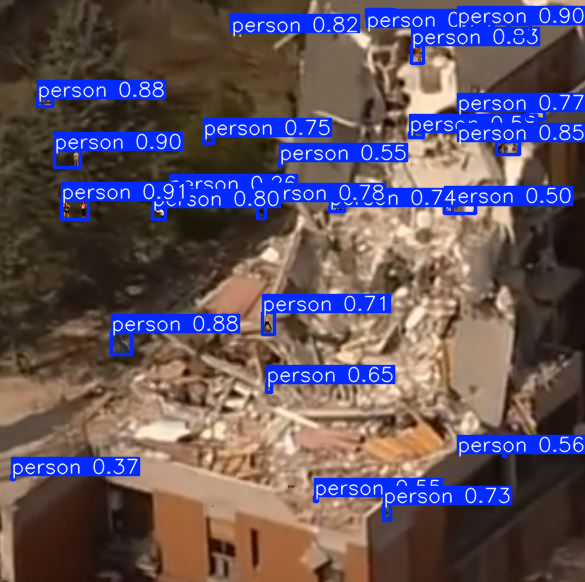

In [ ]:
from PIL import Image

test_image = "/content/drive/MyDrive/UAV_Human_Detection_In_Disaster/test/images/collapsed_building_image0019_0.png"
resultss = model(test_image)


for i, r in enumerate(resultss):

    im_bgr = r.plot()
    im_rgb = Image.fromarray(im_bgr[..., ::-1])

    r.show()

As seen from the results above, the model has a good mAP50 of $0.7970$, which is a decent improvement to the models trained on $640$ image size.

Now the model without augmentation is trained.

In [ ]:
from ultralytics import YOLO
import os

model_no_augmentation = YOLO("yolo11n.pt")

os.environ["ALBUMENTATIONS_DISABLE"] = "1"

results = model_no_augmentation.train(
    data="/content/new_data.yml",
    epochs=10,
    hsv_h=0.0,
    hsv_s=0.0,
    hsv_v=0.0,
    translate=0.0,
    scale=0.0,
    fliplr=0.0,
    mosaic=0.0,
    erasing=0.0,
    auto_augment= False,
    imgsz = 960
)

Ultralytics 8.3.226 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=False, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/new_data.yml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.0, exist_ok=False, fliplr=0.0, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.0, hsv_s=0.0, hsv_v=0.0, imgsz=960, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=0.0, multi_scale=False, name=train4, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretraine

The trained no augmentation model is evaluated on the test set.

In [ ]:
test_results_no_augmentation = model_no_augmentation.val(data="/content/new_data.yml", split='test')

Ultralytics 8.3.226 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 3.8±7.5 ms, read: 0.5±0.5 MB/s, size: 406.5 KB)
val: Scanning /content/drive/MyDrive/UAV_Human_Detection_In_Disaster/test/labels.cache... 2043 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 2043/2043 2.7Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 128/128 0.2it/s 9:11
                   all       2043      72523      0.836      0.744      0.792      0.534
Speed: 1.6ms preprocess, 8.7ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to /content/runs/detect/val


In [ ]:
print(f"mAP@0.50 (Loose Localization): {test_results_no_augmentation.box.map50:.4f}")
print(f"mAP@0.50:0.95 (Strict Localization): {test_results_no_augmentation.box.map:.4f}")

mAP@0.50 (Loose Localization): 0.7924
mAP@0.50:0.95 (Strict Localization): 0.5335


The model's prediction for one of the test images is displayed.


image 1/1 /content/drive/MyDrive/UAV_Human_Detection_In_Disaster/test/images/collapsed_building_image0019_0.png: 960x960 23 persons, 27.0ms
Speed: 17.5ms preprocess, 27.0ms inference, 10.1ms postprocess per image at shape (1, 3, 960, 960)


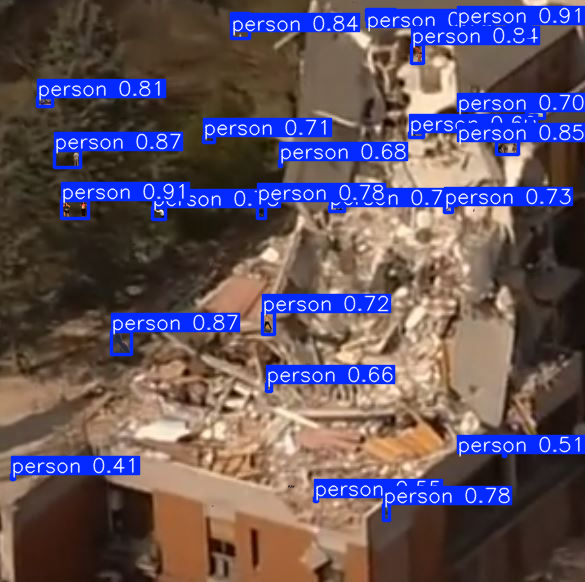

In [ ]:
test_image = "/content/drive/MyDrive/UAV_Human_Detection_In_Disaster/test/images/collapsed_building_image0019_0.png"
resultss = model_no_augmentation(test_image)

for i, r in enumerate(resultss):

    im_bgr = r.plot()
    im_rgb = Image.fromarray(im_bgr[..., ::-1])

    r.show()

As it can be seen above, the model has an mAP50 score of $0.7924$, which is an improvement to the models trained on $640$ image size and is also close to the mAP50 score of the model with augmentation.

# Conclusion



To draw conclusions from the trained models, the output of them on some training images is displayed next to the ground truth.

The weights of the best-performing models trained on $960$ image size are used.

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/best (3).pt")
model_no_augmentation = YOLO("/content/best (4).pt")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


To plot the images, the same method as in the beginning is used for plotting the ground truth.


image 1/1 /content/drive/MyDrive/UAV_Human_Detection_In_Disaster/test/images/flood_image0001_3.png: 544x960 27 persons, 10.6ms
Speed: 4.4ms preprocess, 10.6ms inference, 1.6ms postprocess per image at shape (1, 3, 544, 960)

image 1/1 /content/drive/MyDrive/UAV_Human_Detection_In_Disaster/test/images/flood_image0001_3.png: 544x960 28 persons, 10.4ms
Speed: 4.3ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 544, 960)

image 1/1 /content/drive/MyDrive/UAV_Human_Detection_In_Disaster/test/images/flood_image0084_3.png: 960x960 24 persons, 13.9ms
Speed: 6.6ms preprocess, 13.9ms inference, 1.5ms postprocess per image at shape (1, 3, 960, 960)

image 1/1 /content/drive/MyDrive/UAV_Human_Detection_In_Disaster/test/images/flood_image0084_3.png: 960x960 23 persons, 13.8ms
Speed: 6.5ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 960, 960)

image 1/1 /content/drive/MyDrive/UAV_Human_Detection_In_Disaster/test/images/flood_image0076_3.png:

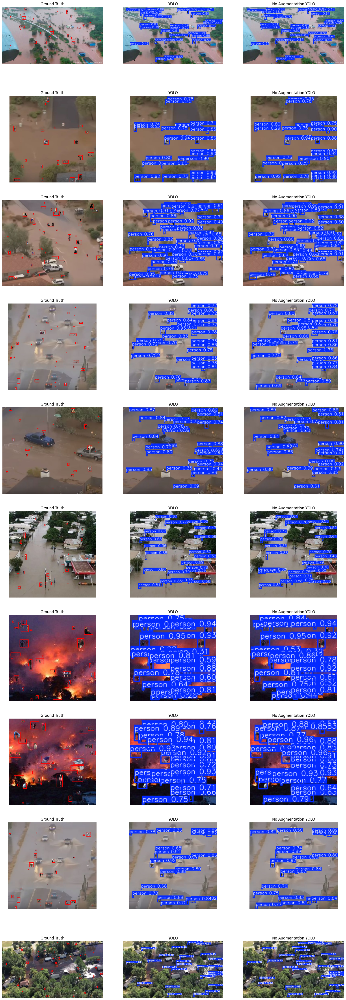

In [ ]:
from PIL import Image

num_images = 10
fig, axes = plt.subplots(num_images, 3, figsize=(2 * num_images, 6 * num_images))

for img in os.listdir(test_images_path):
  if num_images == 0:
    break
  image = PIL.Image.open(os.path.join(test_images_path, img))
  width, height = image.size
  annotation_boxs = os.path.join(test_labels_path , img.split('.')[0] + '.txt')
  axes[10 - num_images,0].imshow(image)
  axes[10 - num_images,0].set_title("Ground Truth")
  axes[10 - num_images,0].axis("off")
  for annotation_box in open(annotation_boxs):
    annotation_box = annotation_box.split(' ')
    x_center, y_center, box_width ,box_height = float(annotation_box[1]), float(annotation_box[2]), float(annotation_box[3]), float(annotation_box[4].split('\n')[0])
    rect = patches.Rectangle((int(x_center * width) - int((box_width * width)/2), int(y_center * height) - int((box_height * height)/2)), width = int(box_width * width), height = int(box_height * height), linewidth=1, edgecolor='r', facecolor='none')
    axes[10 - num_images,0].add_patch(rect)

  result = model(os.path.join(test_images_path, img))
  result_no_augmentation = model_no_augmentation(os.path.join(test_images_path, img))

  axes[10 - num_images,1].imshow(result[0].plot()[..., ::-1])
  axes[10 - num_images,1].set_title("YOLO")
  axes[10 - num_images,1].axis("off")

  axes[10 - num_images,2].imshow(result_no_augmentation[0].plot()[..., ::-1])
  axes[10 - num_images,2].set_title("No Augmentation YOLO")
  axes[10 - num_images,2].axis("off")

  num_images -= 1
plt.show()

The plots above show that the trained models have done a decent job in identifying humans in the picture and are also close in the placement of boxes to each other, and no drastic difference between the two models can be identified.

As it was seen in the results, the mAP50 of the models was basically the same. The results were as follows:

Model mAP50: $0.7970$

No-augment model mAP50: $0.7924$

This difference is very small and doesn't show much of an improvement in using augmentation. There might be a couple of explanations for this, and here two of them are talked about:

1. As seen from the dataset images, the boxes are very small. This may cause the augmentation to have very small effect, as the boxes might cover just 30 pixels of the image, and doing augmentations on these boxes won't change the result that much.

2. The dataset already has a great diversity of situations (flood, building collapse, fire) and different positions of humans. This diversity might cause the augmentation to have little to no effect, as the dataset has good generality from the beginning.

To improve the model, the increase of image size is recommended. The performance from $320$ image size to $640$ and $960$ was noticeable, and higher image sizes are expected to have better results. The results for the model with augmentation on different image sizes are shown below:

mAP50 image size $320$: $0.4857$

mAP50 image size $640$: $0.7301$

mAP50 image size $960$: $0.7970$

One of the reasons for this jump of improvement is the size of the boxes in the image, as a lot of them are very small and might go undetected in low image sizes.

@software{yolo11_ultralytics,
  author = {Glenn Jocher and Jing Qiu},
  title = {Ultralytics YOLO11},
  version = {11.0.0},
  year = {2024},
  url = {https://github.com/ultralytics/ultralytics},
  orcid = {0000-0001-5950-6979, 0000-0003-3783-7069},
  license = {AGPL-3.0}
}